In [1]:
# !pip install hvplot
# !pip install bokeh
# !jupyter nbextension enable --py --sys-prefix hvplot
!pip install --upgrade tensorflow

In [2]:
import pandas as pd
import tensorflow 

In [3]:
housing_pd = pd.read_csv("Notebooks/cali-housing.csv")

In [4]:
housing_pd

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
0,-122.23,37.88,41,880,129.0,322,126,8.3252,NEAR BAY,452600
1,-122.22,37.86,21,7099,1106.0,2401,1138,8.3014,NEAR BAY,358500
2,-122.24,37.85,52,1467,190.0,496,177,7.2574,NEAR BAY,352100
3,-122.25,37.85,52,1274,235.0,558,219,5.6431,NEAR BAY,341300
4,-122.25,37.85,52,1627,280.0,565,259,3.8462,NEAR BAY,342200
...,...,...,...,...,...,...,...,...,...,...
20635,-121.09,39.48,25,1665,374.0,845,330,1.5603,INLAND,78100
20636,-121.21,39.49,18,697,150.0,356,114,2.5568,INLAND,77100
20637,-121.22,39.43,17,2254,485.0,1007,433,1.7000,INLAND,92300
20638,-121.32,39.43,18,1860,409.0,741,349,1.8672,INLAND,84700


In [5]:
housing_pd['ocean_proximity'].value_counts()

<1H OCEAN     9136
INLAND        6551
NEAR OCEAN    2658
NEAR BAY      2290
ISLAND           5
Name: ocean_proximity, dtype: int64

In [6]:
housing_pd_shuffled = housing_pd.sample(n=len(housing_pd), random_state=1)

In [7]:
housing_pd_shuffled

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,ocean_proximity,median_house_value
4712,-118.36,34.06,39,2810,670.0,1109,624,3.2500,<1H OCEAN,355000
2151,-119.78,36.78,37,2185,455.0,1143,438,1.9784,INLAND,70700
15927,-122.42,37.73,46,1819,411.0,1534,406,4.0132,NEAR BAY,229400
82,-122.28,37.81,52,340,97.0,200,87,1.5208,NEAR BAY,112500
8161,-118.13,33.82,37,1530,290.0,711,283,5.1795,<1H OCEAN,225400
...,...,...,...,...,...,...,...,...,...,...
10955,-117.88,33.76,17,1768,474.0,1079,436,1.7823,<1H OCEAN,205300
17289,-119.63,34.42,42,1765,263.0,753,260,8.5608,<1H OCEAN,500001
5192,-118.26,33.93,42,1433,295.0,775,293,1.1326,<1H OCEAN,104800
12172,-117.16,33.73,10,2381,454.0,1323,477,2.6322,INLAND,140700


In [8]:
pd.get_dummies(housing_pd_shuffled['ocean_proximity']).head()

,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
4712,1,0,0,0,0
2151,0,1,0,0,0
15927,0,0,0,1,0
82,0,0,0,1,0
8161,1,0,0,0,0


In [9]:
housing_pd_shuffled.drop('ocean_proximity', axis=1).head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value
4712,-118.36,34.06,39,2810,670.0,1109,624,3.2500,355000
2151,-119.78,36.78,37,2185,455.0,1143,438,1.9784,70700
15927,-122.42,37.73,46,1819,411.0,1534,406,4.0132,229400
82,-122.28,37.81,52,340,97.0,200,87,1.5208,112500
8161,-118.13,33.82,37,1530,290.0,711,283,5.1795,225400


In [10]:
housing_pd_final = pd.concat([housing_pd_shuffled.drop('ocean_proximity',axis=1),
                              pd.get_dummies(housing_pd_shuffled['ocean_proximity'])], axis=1)

housing_pd_final

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,median_house_value,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN
4712,-118.36,34.06,39,2810,670.0,1109,624,3.2500,355000,1,0,0,0,0
2151,-119.78,36.78,37,2185,455.0,1143,438,1.9784,70700,0,1,0,0,0
15927,-122.42,37.73,46,1819,411.0,1534,406,4.0132,229400,0,0,0,1,0
82,-122.28,37.81,52,340,97.0,200,87,1.5208,112500,0,0,0,1,0
8161,-118.13,33.82,37,1530,290.0,711,283,5.1795,225400,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10955,-117.88,33.76,17,1768,474.0,1079,436,1.7823,205300,1,0,0,0,0
17289,-119.63,34.42,42,1765,263.0,753,260,8.5608,500001,1,0,0,0,0
5192,-118.26,33.93,42,1433,295.0,775,293,1.1326,104800,1,0,0,0,0
12172,-117.16,33.73,10,2381,454.0,1323,477,2.6322,140700,0,1,0,0,0


In [11]:
housing_pd_final = housing_pd_final[['longitude','latitude','housing_median_age',	'total_rooms'	,'total_bedrooms',	'population',	'households',	'median_income',	'<1H OCEAN',	'INLAND',	'ISLAND',	'NEAR BAY',	'NEAR OCEAN', 'median_house_value']]

In [12]:
housing_pd_final

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,median_house_value
4712,-118.36,34.06,39,2810,670.0,1109,624,3.2500,1,0,0,0,0,355000
2151,-119.78,36.78,37,2185,455.0,1143,438,1.9784,0,1,0,0,0,70700
15927,-122.42,37.73,46,1819,411.0,1534,406,4.0132,0,0,0,1,0,229400
82,-122.28,37.81,52,340,97.0,200,87,1.5208,0,0,0,1,0,112500
8161,-118.13,33.82,37,1530,290.0,711,283,5.1795,1,0,0,0,0,225400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10955,-117.88,33.76,17,1768,474.0,1079,436,1.7823,1,0,0,0,0,205300
17289,-119.63,34.42,42,1765,263.0,753,260,8.5608,1,0,0,0,0,500001
5192,-118.26,33.93,42,1433,295.0,775,293,1.1326,1,0,0,0,0,104800
12172,-117.16,33.73,10,2381,454.0,1323,477,2.6322,0,1,0,0,0,140700


In [13]:
housing_pd_final = housing_pd_final.dropna()
len(housing_pd_final)

20433

In [14]:
train_pd, test_pd, val_pd = housing_pd_final[:18000], housing_pd_final[18000:19215], housing_pd_final[19215:]
len(train_pd), len(test_pd), len(val_pd)

(18000, 1215, 1218)

In [15]:
x_train, y_train = train_pd.iloc[:, :-1].values, train_pd.iloc[:, -1].values
x_val, y_val = val_pd.iloc[:, :-1].values, val_pd.iloc[:, -1].values
x_test, y_test = test_pd.iloc[:, :-1].values, test_pd.iloc[:, -1].values
x_train.shape, y_train.shape, x_val.shape, y_val.shape, x_test.shape, y_test.shape

((18000, 13), (18000,), (1218, 13), (1218,), (1215, 13), (1215,))

Plotting to visualize the data

In [16]:
import numpy as np
import pandas as pd
train_data = np.concatenate((x_train, y_train.reshape(-1, 1)), axis=1)
train_data = pd.DataFrame(train_data, columns=list(train_pd.columns))
train_data

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,median_house_value
0,-118.36,34.06,39.0,2810.0,670.0,1109.0,624.0,3.2500,1.0,0.0,0.0,0.0,0.0,355000.0
1,-119.78,36.78,37.0,2185.0,455.0,1143.0,438.0,1.9784,0.0,1.0,0.0,0.0,0.0,70700.0
2,-122.42,37.73,46.0,1819.0,411.0,1534.0,406.0,4.0132,0.0,0.0,0.0,1.0,0.0,229400.0
3,-122.28,37.81,52.0,340.0,97.0,200.0,87.0,1.5208,0.0,0.0,0.0,1.0,0.0,112500.0
4,-118.13,33.82,37.0,1530.0,290.0,711.0,283.0,5.1795,1.0,0.0,0.0,0.0,0.0,225400.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17995,-118.11,33.89,34.0,2508.0,594.0,1549.0,545.0,3.2069,1.0,0.0,0.0,0.0,0.0,236500.0
17996,-120.49,37.31,45.0,1834.0,421.0,1405.0,407.0,2.0521,0.0,1.0,0.0,0.0,0.0,72400.0
17997,-118.38,34.07,21.0,3653.0,956.0,1510.0,890.0,3.5573,1.0,0.0,0.0,0.0,0.0,500001.0
17998,-117.31,34.07,40.0,2936.0,732.0,2024.0,676.0,2.1139,0.0,1.0,0.0,0.0,0.0,70900.0


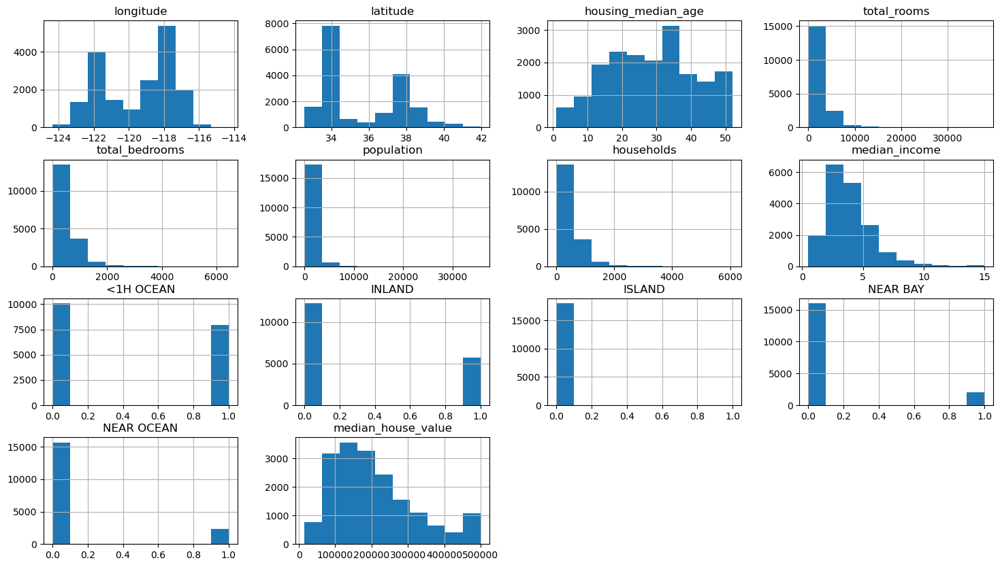

In [17]:
train_data.hist(figsize=(18, 10));

In [18]:
train_data.corr()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,median_house_value
longitude,1.000000,-0.924671,-0.111637,0.045401,0.069697,0.100932,0.056362,-0.020077,0.316519,-0.053845,0.010109,-0.473997,0.049295,-0.052679
latitude,-0.924671,1.000000,0.013487,-0.035481,-0.066194,-0.109129,-0.071324,-0.074986,-0.443853,0.350108,-0.017747,0.357984,-0.163688,-0.138398
housing_median_age,-0.111637,0.013487,1.000000,-0.361840,-0.322322,-0.297041,-0.304661,-0.111915,0.049289,-0.238113,0.018190,0.253043,0.020385,0.110947
total_rooms,0.045401,-0.035481,-0.361840,1.000000,0.928760,0.854350,0.916877,0.197665,-0.003999,0.027936,-0.008124,-0.022273,-0.011668,0.135597
total_bedrooms,0.069697,-0.066194,-0.322322,0.928760,1.000000,0.874181,0.978701,-0.008897,0.019287,-0.006659,-0.004655,-0.018285,-0.001951,0.052147
population,0.100932,-0.109129,-0.297041,0.854350,0.874181,1.000000,0.904908,0.005253,0.073244,-0.019662,-0.011108,-0.060105,-0.024287,-0.023314
households,0.056362,-0.071324,-0.304661,0.916877,0.978701,0.904908,1.000000,0.013187,0.043286,-0.039540,-0.009745,-0.009525,0.000289,0.068178
median_income,-0.020077,-0.074986,-0.111915,0.197665,-0.008897,0.005253,0.013187,1.000000,0.168504,-0.236155,-0.009875,0.060214,0.023006,0.686830
<1H OCEAN,0.316519,-0.443853,0.049289,-0.003999,0.019287,0.073244,0.043286,0.168504,1.000000,-0.607617,-0.014787,-0.313021,-0.341820,0.258366
INLAND,-0.053845,0.350108,-0.238113,0.027936,-0.006659,-0.019662,-0.039540,-0.236155,-0.607617,1.000000,-0.011417,-0.241687,-0.263923,-0.485694


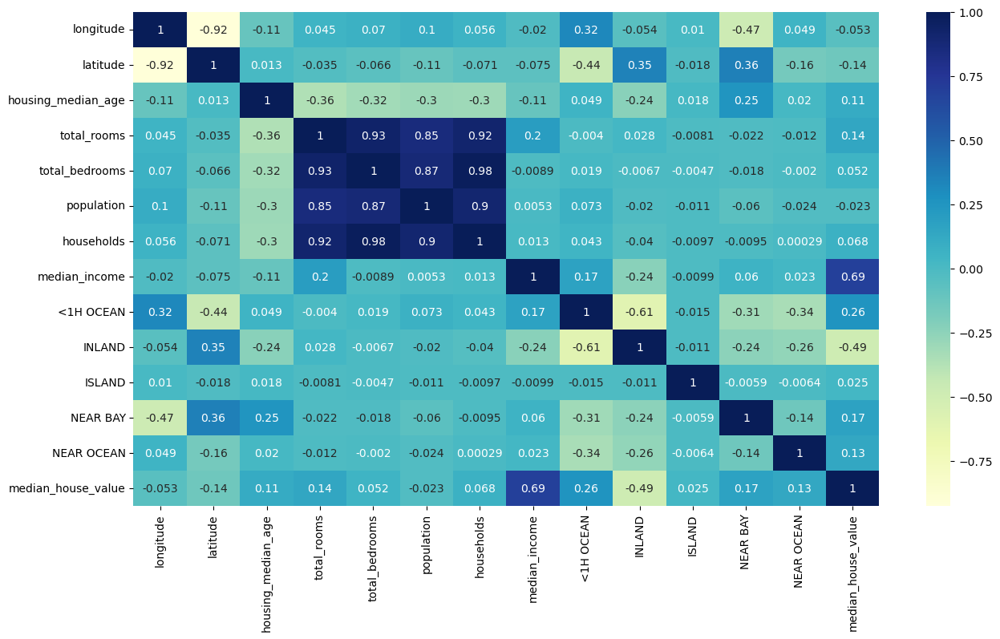

In [19]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
plt.figure(figsize=(15,8))
sns.heatmap(train_data.corr(), annot= True, cmap="YlGnBu");

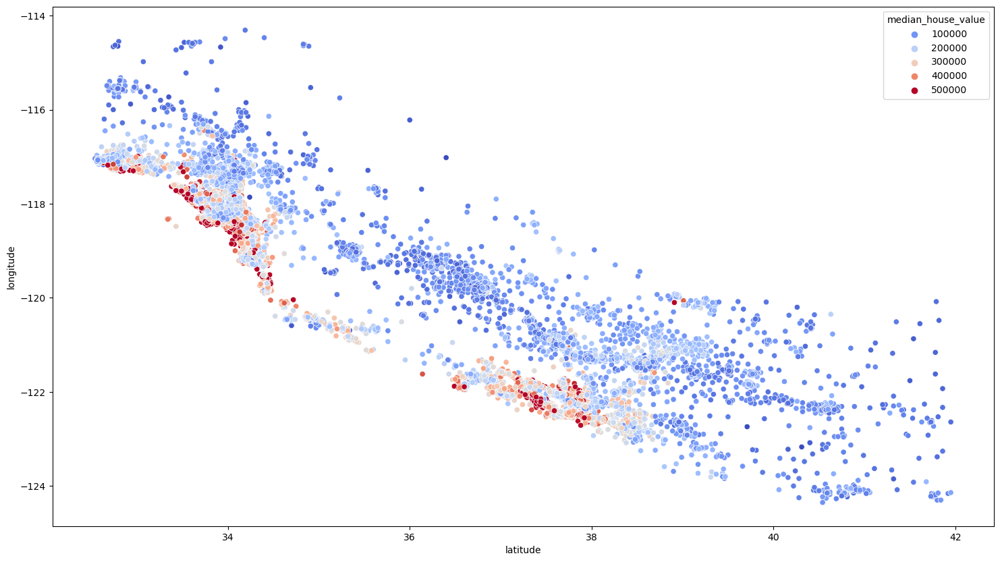

In [20]:
plt.figure(figsize=(18,10))
sns.scatterplot(x='latitude', y='longitude', data=train_data, hue='median_house_value', palette='coolwarm' );

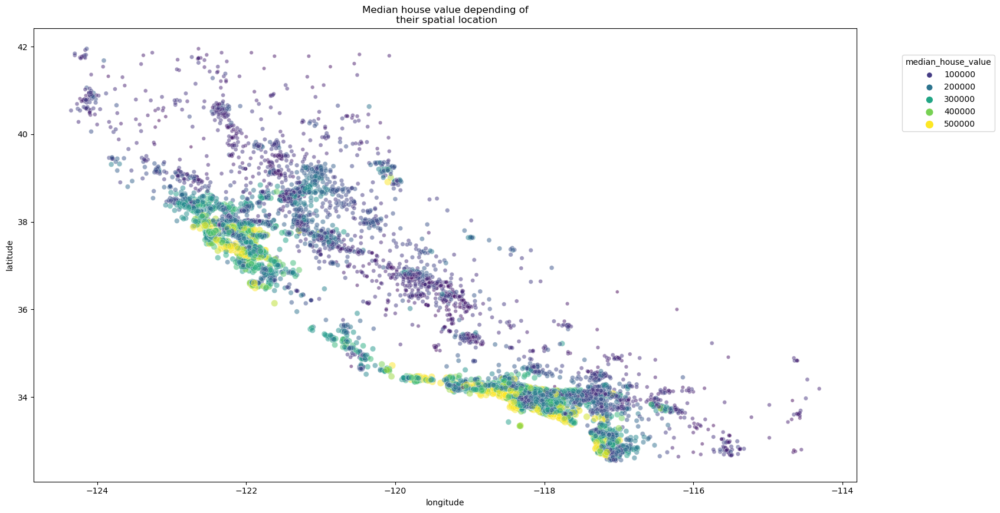

In [21]:
import seaborn as sns

plt.figure(figsize=(18,10))
sns.scatterplot(x="longitude", y="latitude", data=train_data,
                size="median_house_value", hue="median_house_value",
                palette="viridis", alpha=0.5)
plt.legend(title="median_house_value", bbox_to_anchor=(1.05, 0.95),
           loc="upper left")
_ = plt.title("Median house value depending of\n their spatial location")

In [22]:
train_data.columns

Index(['longitude', 'latitude', 'housing_median_age', 'total_rooms',
       'total_bedrooms', 'population', 'households', 'median_income',
       '<1H OCEAN', 'INLAND', 'ISLAND', 'NEAR BAY', 'NEAR OCEAN',
       'median_house_value'],
      dtype='object')

In [23]:
from sklearn.preprocessing import StandardScaler 
import numpy as np

scaler = StandardScaler().fit(x_train[:, :8])

def preprocessor(X):
  A = np.copy(X)
  A[:, :8] = scaler.transform(A[:, :8])
  return A

x_train, x_val, x_test = preprocessor(x_train), preprocessor(x_val), preprocessor(x_test)

x_train.shape, x_val.shape, x_test.shape

((18000, 13), (1218, 13), (1215, 13))

In [24]:
scaled_df = pd.DataFrame(x_train)
scaled_df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,0.603443,-0.736073,0.820845,0.081039,0.315396,-0.276840,0.328234,-0.326667,1.0,0.0,0.0,0.0,0.0
1,-0.105122,0.537108,0.661774,-0.206526,-0.196843,-0.246809,-0.160526,-0.995001,0.0,1.0,0.0,0.0,0.0
2,-1.422454,0.981785,1.377592,-0.374924,-0.301674,0.098553,-0.244613,0.074459,0.0,0.0,0.0,1.0,0.0
3,-1.352596,1.019231,1.854804,-1.055419,-1.049782,-1.079740,-1.082862,-1.235508,0.0,0.0,0.0,1.0,0.0
4,0.718211,-0.848412,0.661774,-0.507894,-0.589957,-0.628385,-0.567825,0.687448,1.0,0.0,0.0,0.0,0.0


## Linear Regression

In [25]:
# sum((y_hat(x) -y)^2)/n

from sklearn.metrics import mean_squared_error as mse
from sklearn.linear_model import LinearRegression

lm = LinearRegression().fit(x_train, y_train)

mse(lm.predict(x_train), y_train, squared=False), mse(lm.predict(x_val), y_val, squared=False)

(68593.05578127236, 71382.43558330163)

Required library for plotting

In [26]:
#Predict the housing prices for the training and validation sets using the linear regression model:
y_train_pred_lr = lm.predict(x_train)
y_val_pred_lr = lm.predict(x_val)

In [27]:
df_with_pred=pd.concat([train_data,pd.Series(y_val_pred_lr,name="Prediction")],axis=1)
df_with_pred.dropna()


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,median_house_value,Prediction
0,-118.36,34.06,39.0,2810.0,670.0,1109.0,624.0,3.2500,1.0,0.0,0.0,0.0,0.0,355000.0,372538.693202
1,-119.78,36.78,37.0,2185.0,455.0,1143.0,438.0,1.9784,0.0,1.0,0.0,0.0,0.0,70700.0,272919.215000
2,-122.42,37.73,46.0,1819.0,411.0,1534.0,406.0,4.0132,0.0,0.0,0.0,1.0,0.0,229400.0,225930.529428
3,-122.28,37.81,52.0,340.0,97.0,200.0,87.0,1.5208,0.0,0.0,0.0,1.0,0.0,112500.0,253561.142832
4,-118.13,33.82,37.0,1530.0,290.0,711.0,283.0,5.1795,1.0,0.0,0.0,0.0,0.0,225400.0,222826.977571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1213,-118.38,33.96,44.0,2395.0,458.0,1287.0,450.0,4.6923,1.0,0.0,0.0,0.0,0.0,299000.0,136157.992865
1214,-121.86,37.25,16.0,6958.0,1300.0,2965.0,1217.0,4.2885,1.0,0.0,0.0,0.0,0.0,262400.0,440047.801860
1215,-122.69,38.51,18.0,3364.0,501.0,1442.0,506.0,6.6854,1.0,0.0,0.0,0.0,0.0,313000.0,132382.825616
1216,-117.96,34.00,34.0,2777.0,540.0,1954.0,522.0,4.5163,1.0,0.0,0.0,0.0,0.0,183800.0,91203.447727


In [28]:
df_with_pred.head()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,median_house_value,Prediction
0,-118.36,34.06,39.0,2810.0,670.0,1109.0,624.0,3.2500,1.0,0.0,0.0,0.0,0.0,355000.0,372538.693202
1,-119.78,36.78,37.0,2185.0,455.0,1143.0,438.0,1.9784,0.0,1.0,0.0,0.0,0.0,70700.0,272919.215000
2,-122.42,37.73,46.0,1819.0,411.0,1534.0,406.0,4.0132,0.0,0.0,0.0,1.0,0.0,229400.0,225930.529428
3,-122.28,37.81,52.0,340.0,97.0,200.0,87.0,1.5208,0.0,0.0,0.0,1.0,0.0,112500.0,253561.142832
4,-118.13,33.82,37.0,1530.0,290.0,711.0,283.0,5.1795,1.0,0.0,0.0,0.0,0.0,225400.0,222826.977571


In [29]:
df_with_pred.tail()

,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,median_house_value,Prediction
17995,-118.11,33.89,34.0,2508.0,594.0,1549.0,545.0,3.2069,1.0,0.0,0.0,0.0,0.0,236500.0,NaN
17996,-120.49,37.31,45.0,1834.0,421.0,1405.0,407.0,2.0521,0.0,1.0,0.0,0.0,0.0,72400.0,NaN
17997,-118.38,34.07,21.0,3653.0,956.0,1510.0,890.0,3.5573,1.0,0.0,0.0,0.0,0.0,500001.0,NaN
17998,-117.31,34.07,40.0,2936.0,732.0,2024.0,676.0,2.1139,0.0,1.0,0.0,0.0,0.0,70900.0,NaN
17999,-117.72,33.62,21.0,2322.0,518.0,662.0,457.0,3.1679,1.0,0.0,0.0,0.0,0.0,110000.0,NaN


In [30]:
df_with_pred[["median_house_value","Prediction"]].dropna()

,median_house_value,Prediction
0,355000.0,372538.693202
1,70700.0,272919.215000
2,229400.0,225930.529428
3,112500.0,253561.142832
4,225400.0,222826.977571
...,...,...
1213,299000.0,136157.992865
1214,262400.0,440047.801860
1215,313000.0,132382.825616
1216,183800.0,91203.447727


Plot the actual and predicted housing prices for the training and validation sets:

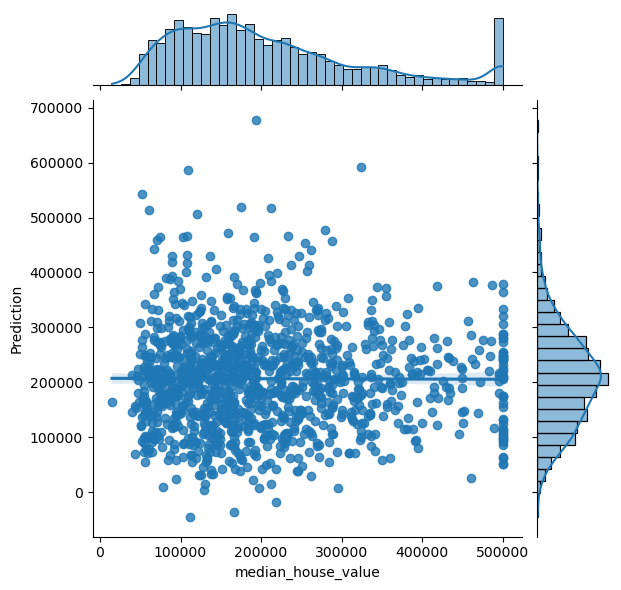

In [31]:
sns.jointplot(x=df_with_pred.median_house_value, y=df_with_pred.Prediction, kind='reg');

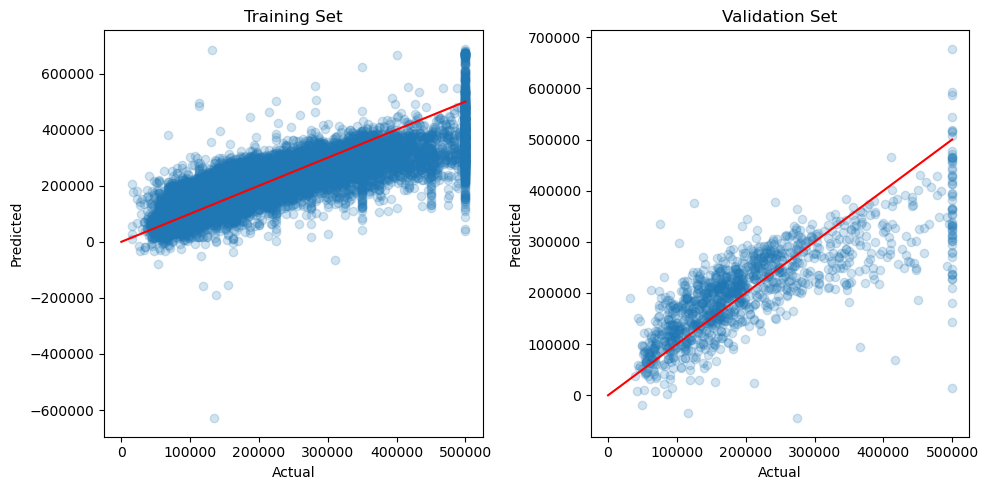

In [32]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].scatter(y_train, y_train_pred_lr, alpha=0.2)
axs[0].plot([0, np.max(y_train)], [0, np.max(y_train)], color='red')
axs[0].set_xlabel('Actual')
axs[0].set_ylabel('Predicted')
axs[0].set_title('Training Set')

axs[1].scatter(y_val, y_val_pred_lr, alpha=0.2)
axs[1].plot([0, np.max(y_val)], [0, np.max(y_val)], color='red')
axs[1].set_xlabel('Actual')
axs[1].set_ylabel('Predicted')
axs[1].set_title('Validation Set')

plt.tight_layout()
plt.show()


## K Nearest Neighbors

In [33]:
from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor(n_neighbors=10).fit(x_train, y_train)
mse(knn.predict(x_train), y_train, squared=False), mse(knn.predict(x_val), y_val, squared=False)

(53759.09908812057, 62161.22860469906)

In [34]:
#predict for knn
y_train_pred_knn = knn.predict(x_train)
y_val_pred_knn = knn.predict(x_val)

Plot the actual and predicted housing prices for the training and validation sets:

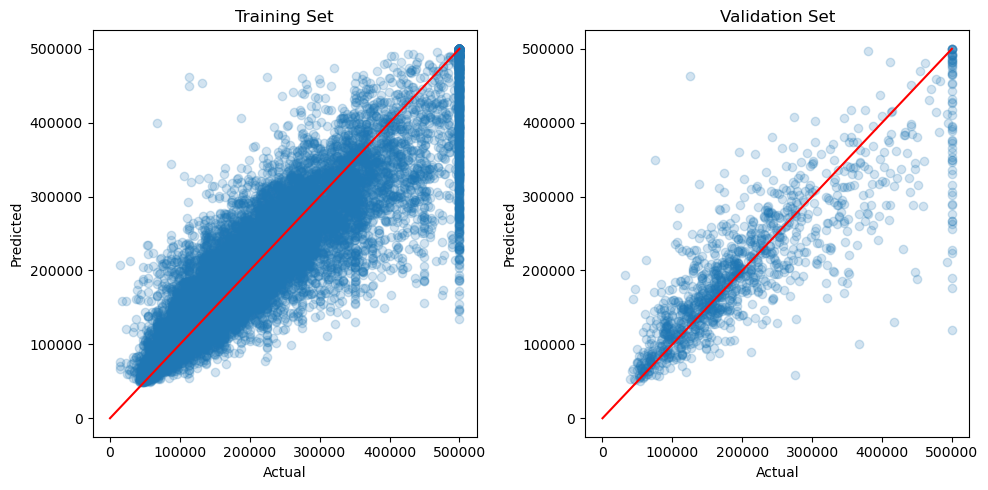

In [35]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].scatter(y_train, y_train_pred_knn, alpha=0.2)
axs[0].plot([0, np.max(y_train)], [0, np.max(y_train)], color='red')
axs[0].set_xlabel('Actual')
axs[0].set_ylabel('Predicted')
axs[0].set_title('Training Set')

axs[1].scatter(y_val, y_val_pred_knn, alpha=0.2)
axs[1].plot([0, np.max(y_val)], [0, np.max(y_val)], color='red')
axs[1].set_xlabel('Actual')
axs[1].set_ylabel('Predicted')
axs[1].set_title('Validation Set')

plt.tight_layout()
plt.show()


## Random Forest

In [36]:
from sklearn.ensemble import RandomForestRegressor

rfr = RandomForestRegressor(max_depth=10).fit(x_train, y_train)

mse_train = mse(rfr.predict(x_train), y_train, squared=False)
mse_val = mse(rfr.predict(x_val), y_val, squared=False)

print(f"Random Forest:\n  Training set MSE: {mse_train}\n  Validation set MSE: {mse_val}")

Random Forest:
  Training set MSE: 43640.806399637455
  Validation set MSE: 53409.09708400323


In [37]:
y_train_pred_rf = rfr.predict(x_train)
y_val_pred_rf = rfr.predict(x_val)

Plot the actual and predicted housing prices for the training and validation sets:

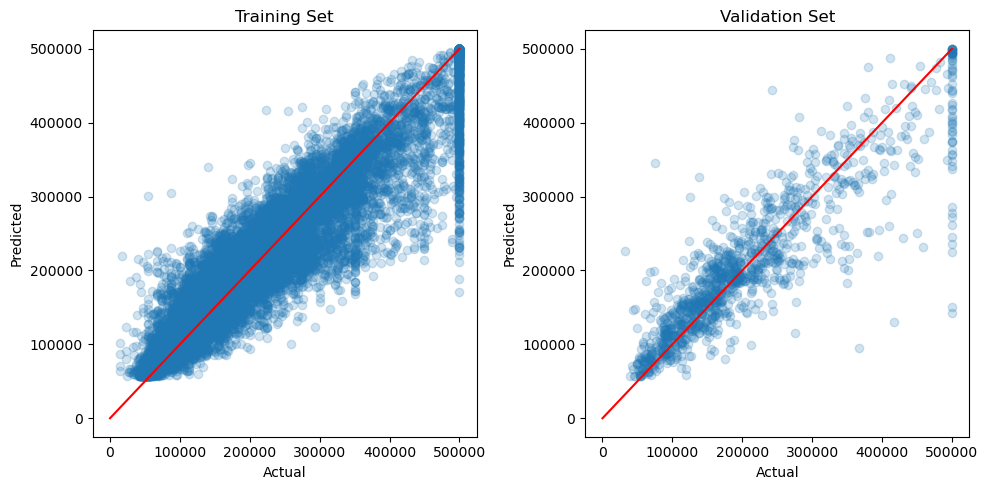

In [38]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].scatter(y_train, y_train_pred_rf, alpha=0.2)
axs[0].plot([0, np.max(y_train)], [0, np.max(y_train)], color='red')
axs[0].set_xlabel('Actual')
axs[0].set_ylabel('Predicted')
axs[0].set_title('Training Set')

axs[1].scatter(y_val, y_val_pred_rf, alpha=0.2)
axs[1].plot([0, np.max(y_val)], [0, np.max(y_val)], color='red')
axs[1].set_xlabel('Actual')
axs[1].set_ylabel('Predicted')
axs[1].set_title('Validation Set')

plt.tight_layout()
plt.show()


## Gradient Boosting Regressor

In [39]:
from sklearn.ensemble import GradientBoostingRegressor

gbr = GradientBoostingRegressor(n_estimators=250).fit(x_train, y_train)

mse(gbr.predict(x_train), y_train, squared=False), mse(gbr.predict(x_val), y_val, squared=False)


(47274.82259072158, 51377.573181441934)

In [40]:
y_train_pred_gbr = gbr.predict(x_train)
y_val_pred_gbr = gbr.predict(x_val)

In [41]:
df_with_pred=pd.concat([train_data,pd.Series(y_val_pred_gbr,name="Prediction")],axis=1)
df_with_pred.dropna()


,longitude,latitude,housing_median_age,total_rooms,total_bedrooms,population,households,median_income,<1H OCEAN,INLAND,ISLAND,NEAR BAY,NEAR OCEAN,median_house_value,Prediction
0,-118.36,34.06,39.0,2810.0,670.0,1109.0,624.0,3.2500,1.0,0.0,0.0,0.0,0.0,355000.0,411423.294909
1,-119.78,36.78,37.0,2185.0,455.0,1143.0,438.0,1.9784,0.0,1.0,0.0,0.0,0.0,70700.0,268995.528573
2,-122.42,37.73,46.0,1819.0,411.0,1534.0,406.0,4.0132,0.0,0.0,0.0,1.0,0.0,229400.0,232304.207351
3,-122.28,37.81,52.0,340.0,97.0,200.0,87.0,1.5208,0.0,0.0,0.0,1.0,0.0,112500.0,230809.925875
4,-118.13,33.82,37.0,1530.0,290.0,711.0,283.0,5.1795,1.0,0.0,0.0,0.0,0.0,225400.0,183411.249445
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1213,-118.38,33.96,44.0,2395.0,458.0,1287.0,450.0,4.6923,1.0,0.0,0.0,0.0,0.0,299000.0,158594.290694
1214,-121.86,37.25,16.0,6958.0,1300.0,2965.0,1217.0,4.2885,1.0,0.0,0.0,0.0,0.0,262400.0,486282.410777
1215,-122.69,38.51,18.0,3364.0,501.0,1442.0,506.0,6.6854,1.0,0.0,0.0,0.0,0.0,313000.0,119880.840179
1216,-117.96,34.00,34.0,2777.0,540.0,1954.0,522.0,4.5163,1.0,0.0,0.0,0.0,0.0,183800.0,94401.973129


In [42]:
newdf=df_with_pred[["median_house_value","Prediction"]].dropna()

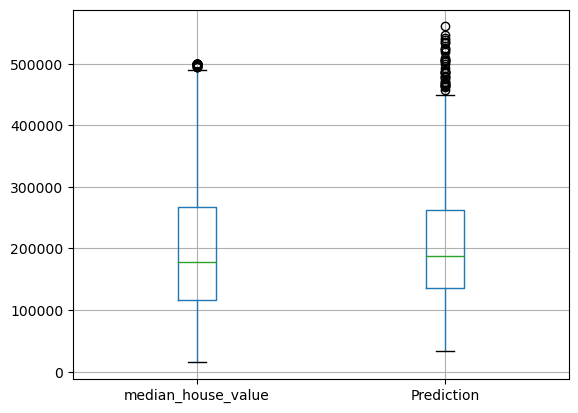

In [43]:
#newdf.plot(x="median_house_value",y="Prediction",kind="scatter")
newdf.boxplot(column=["median_house_value","Prediction"]);

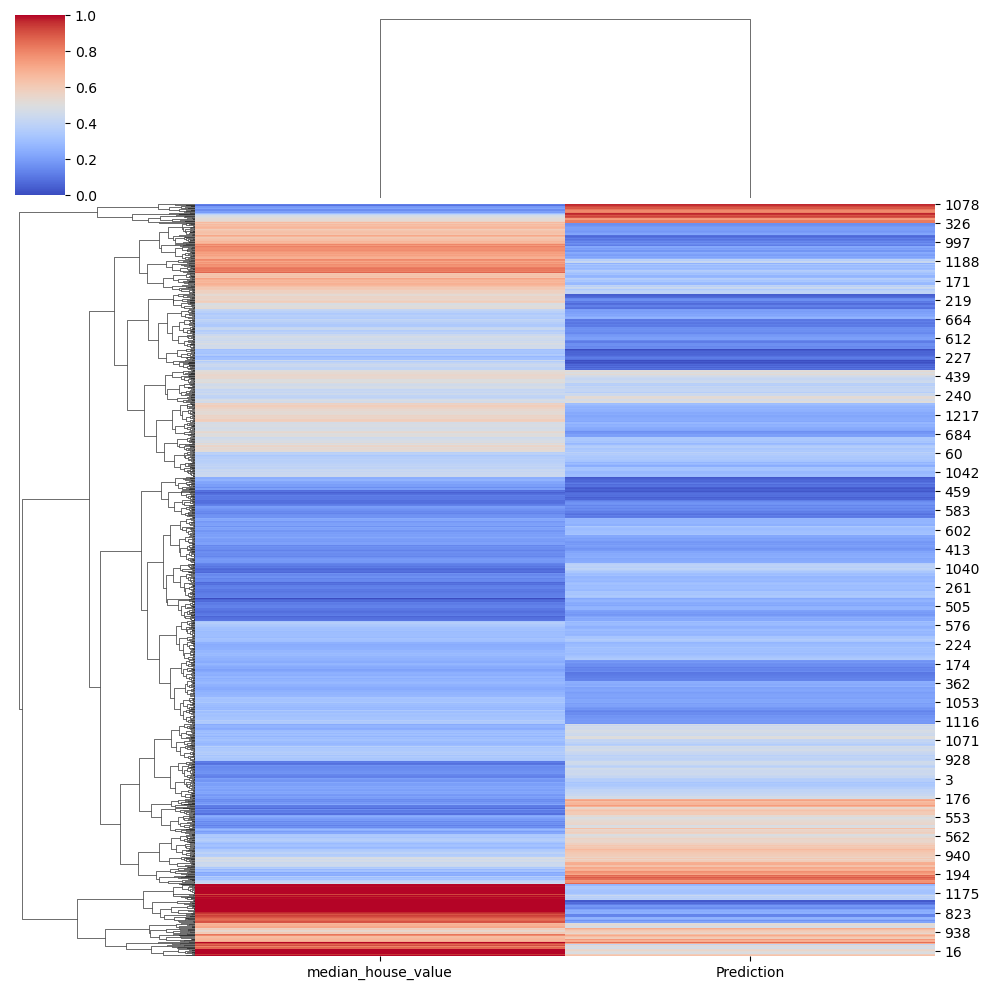

In [63]:
import seaborn as sns
sns.clustermap(newdf,cmap='coolwarm',standard_scale=1);

Plot the actual and predicted housing prices for the training and validation sets:

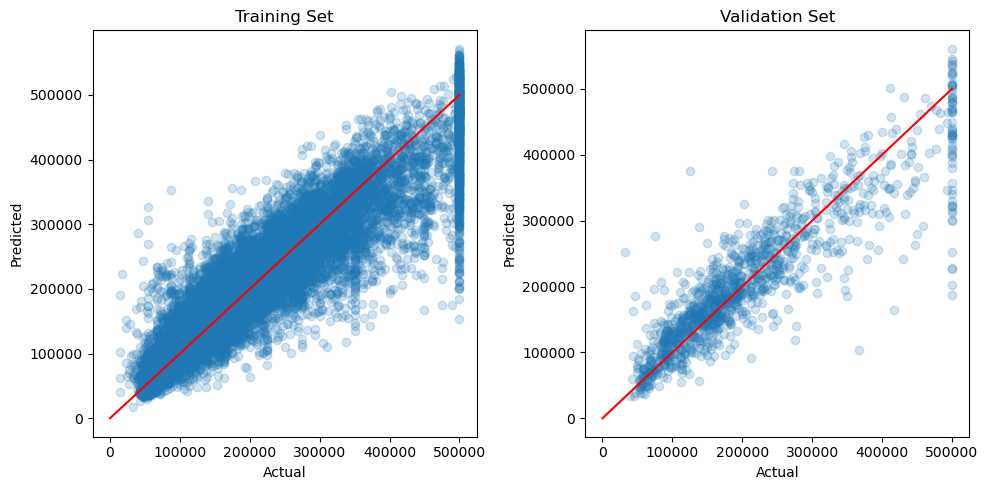

In [45]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))

axs[0].scatter(y_train, y_train_pred_gbr, alpha=0.2)
axs[0].plot([0, np.max(y_train)], [0, np.max(y_train)], color='red')
axs[0].set_xlabel('Actual')
axs[0].set_ylabel('Predicted')
axs[0].set_title('Training Set')

axs[1].scatter(y_val, y_val_pred_gbr, alpha=0.2)
axs[1].plot([0, np.max(y_val)], [0, np.max(y_val)], color='red')
axs[1].set_xlabel('Actual')
axs[1].set_ylabel('Predicted')
axs[1].set_title('Validation Set')

plt.tight_layout()
plt.show()


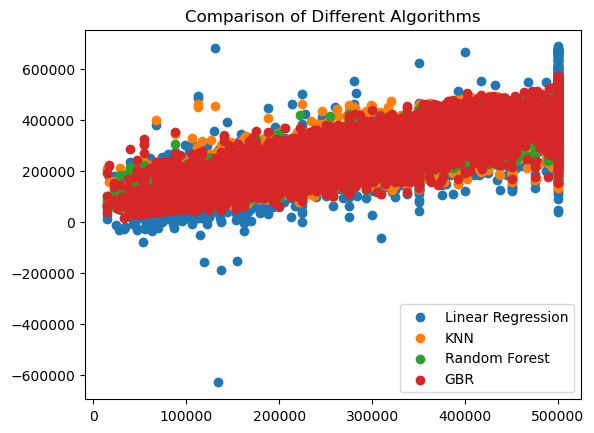

In [46]:
plt.figure()
plt.title('Comparison of Different Algorithms')
plt.scatter(y_train,lm.predict(x_train),label='Linear Regression')
plt.scatter(y_train,knn.predict(x_train),label='KNN')
plt.scatter(y_train,rfr.predict(x_train),label='Random Forest')
plt.scatter(y_train,gbr.predict(x_train),label='GBR')
plt.legend()

In [47]:
print("Linear Regression:")
print("  Training set MSE:", mse(y_train_pred_lr, y_train, squared=False))
print("  Validation set MSE:", mse(y_val_pred_lr, y_val, squared=False))

print("K-Nearest Neighbors:")
print("  Training set MSE:", mse(y_train_pred_knn, y_train, squared=False))
print("  Validation set MSE:", mse(y_val_pred_knn, y_val, squared=False))

print("Random Forest:")
print("  Training set MSE:", mse(y_train_pred_rf, y_train, squared=False))
print("  Validation set MSE:", mse(y_val_pred_rf, y_val, squared=False))

print("Gradient Boosting:")
print("  Training set MSE:", mse(y_train_pred_gbr, y_train, squared=False))
print("  Validation set MSE:", mse(y_val_pred_gbr, y_val, squared=False))


Linear Regression:
  Training set MSE: 68593.05578127236
  Validation set MSE: 71382.43558330163
K-Nearest Neighbors:
  Training set MSE: 53759.09908812057
  Validation set MSE: 62161.22860469906
Random Forest:
  Training set MSE: 43640.806399637455
  Validation set MSE: 53409.09708400323
Gradient Boosting:
  Training set MSE: 47274.82259072158
  Validation set MSE: 51377.573181441934


In this case, we can see that the Gradient Boosting model has the lowest MSE on the validation set (i.e., 51243.34513112385), indicating that it is the best performing model for this particular problem.

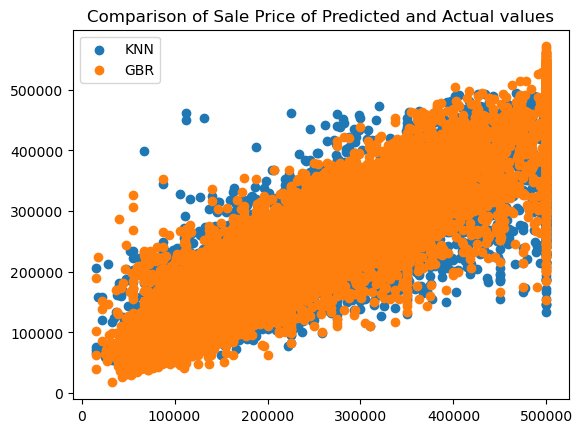

In [48]:
plt.figure()
plt.title('Comparison of Sale Price of Predicted and Actual values')
plt.scatter(y_train,knn.predict(x_train),label='KNN')
plt.scatter(y_train,gbr.predict(x_train),label='GBR')
plt.legend();

In [49]:
import hvplot.pandas  # import hvplot for pandas

#plot actual vs. predicted values for linear regression model
linear_reg_plot = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_lr}).hvplot.line(
    label='Linear Regression', xlabel='Actual', ylabel='Predicted',
    title='Actual vs. Predicted Values for Linear Regression Model')


# display all plots with a legend
(linear_reg_plot).opts(
    legend_position='top_right')

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [50]:
# plot actual vs. predicted values for k-nearest neighbors model
knn_plot = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_knn}).hvplot.line(
    label='KNN', xlabel='Actual', ylabel='Predicted',
    title='Actual vs. Predicted Values for KNN Model')
(knn_plot).opts(
    legend_position='top_right')

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [51]:

# plot actual vs. predicted values for random forest regression model
random_forest_plot = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_rf}).hvplot.line(
    label='Random Forest', xlabel='Actual', ylabel='Predicted',
    title='Actual vs. Predicted Values for Random Forest Model')
(random_forest_plot).opts(
    legend_position='top_right')

:NdOverlay   [Variable]
   :Curve   [index]   (value)

In [52]:

# plot actual vs. predicted values for gradient boosting regression model
gradient_boosting_plot = pd.DataFrame({'Actual': y_val, 'Predicted': y_val_pred_gbr}).hvplot.line(
    label='Gradient Boosting', xlabel='Actual', ylabel='Predicted',
    title='Actual vs. Predicted Values for Gradient Boosting Model')
(gradient_boosting_plot).opts(
    legend_position='top_right')

:NdOverlay   [Variable]
   :Curve   [index]   (value)

## Neural Networks

In [53]:
!pip install tensorflow 2.11.0

ERROR: Could not find a version that satisfies the requirement 2.11.0 (from versions: none)
ERROR: No matching distribution found for 2.11.0


In [54]:
!pip install tensorflow 2.11.0
import tensorflow 

ERROR: Could not find a version that satisfies the requirement 2.11.0 (from versions: none)
ERROR: No matching distribution found for 2.11.0


In [55]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.optimizers import Adam

In [56]:
simple_nn = Sequential()
simple_nn.add(InputLayer((13, )))
simple_nn.add(Dense(2, 'relu'))
simple_nn.add(Dense(1, 'linear'))

opt= Adam(learning_rate=.1)
cp = ModelCheckpoint('models/simple_nn', save_best_only=True)
simple_nn.compile(optimizer=opt, loss='mse', metrics= [RootMeanSquaredError()])

simple_nn.fit(x=x_train, y=y_train, validation_data=(x_val, y_val), callbacks=[cp], epochs=1)

512/563 [==========================>...] - ETA: 0s - loss: 51671371776.0000 - root_mean_squared_error: 227313.3750

INFO:tensorflow:Assets written to: models\simple_nn\assets


INFO:tensorflow:Assets written to: models\simple_nn\assets


563/563 [==============================] - 1s 2ms/step - loss: 50641670144.0000 - root_mean_squared_error: 225037.0469 - val_loss: 40785674240.0000 - val_root_mean_squared_error: 201954.6406


In [57]:
from tensorflow.keras.models import load_model

simple_nn = load_model('models/simple_nn')

mse(simple_nn.predict(x_train), y_train, squared=False), mse(simple_nn.predict(x_val), y_val, squared=False)

39/39 [==============================] - 0s 632us/step


(201411.70236145303, 201954.63053864485)

In [58]:
medium_nn = Sequential()
medium_nn.add(InputLayer((13, )))
medium_nn.add(Dense(32, 'relu'))
medium_nn.add(Dense(16, 'relu'))
medium_nn.add(Dense(1, 'linear'))

opt= Adam(learning_rate=.1)
cp = ModelCheckpoint('models/medium_nn', save_best_only=True)
medium_nn.compile(optimizer=opt, loss='mse', metrics= [RootMeanSquaredError()])

medium_nn.fit(x=x_train, y=y_train, validation_data=(x_val, y_val), callbacks=[cp], epochs=1)

552/563 [============================>.] - ETA: 0s - loss: 8597331968.0000 - root_mean_squared_error: 92721.7969

INFO:tensorflow:Assets written to: models\medium_nn\assets


INFO:tensorflow:Assets written to: models\medium_nn\assets


563/563 [==============================] - 1s 2ms/step - loss: 8524063744.0000 - root_mean_squared_error: 92325.8594 - val_loss: 4921686528.0000 - val_root_mean_squared_error: 70154.7344


In [59]:
large_nn = Sequential()
large_nn.add(InputLayer((13, )))
large_nn.add(Dense(256, 'relu'))
large_nn.add(Dense(128, 'relu'))
large_nn.add(Dense(64, 'relu'))
large_nn.add(Dense(32, 'relu'))
large_nn.add(Dense(1, 'linear'))

opt= Adam(learning_rate=.1)
cp = ModelCheckpoint('models/large_nn', save_best_only=True)
large_nn.compile(optimizer=opt, loss='mse', metrics= [RootMeanSquaredError()])

large_nn.fit(x=x_train, y=y_train, validation_data=(x_val, y_val), callbacks=[cp], epochs=1)

560/563 [============================>.] - ETA: 0s - loss: 6265233920.0000 - root_mean_squared_error: 79153.2344

INFO:tensorflow:Assets written to: models\large_nn\assets


INFO:tensorflow:Assets written to: models\large_nn\assets


563/563 [==============================] - 2s 3ms/step - loss: 6247925248.0000 - root_mean_squared_error: 79043.8203 - val_loss: 5746832896.0000 - val_root_mean_squared_error: 75807.8672


In [60]:
import tensorflow as tf
from sklearn.metrics import mean_squared_error

from tensorflow.keras.models import load_model
from tensorflow.keras.utils import plot_model

In [61]:
large_nn = load_model('models/large_nn')
print("Training set RMSE:", mean_squared_error(large_nn.predict(x_train), y_train, squared=False))
print("Validation set RMSE:", mean_squared_error(large_nn.predict(x_val), y_val, squared=False))

563/563 [==============================] - 0s 685us/step
Training set RMSE: 72695.01379462433
39/39 [==============================] - 0s 681us/step
Validation set RMSE: 75807.86778982585


In [62]:
## Gradient Boosting MSE (Best Performing)

print("Test set RMSE:", mean_squared_error(gbr.predict(x_test), y_test, squared=False))

plot_model(large_nn, to_file='large_nn.png', show_shapes=True);

Test set RMSE: 49318.55232120325
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.
